In [54]:
#Fit Double ODMR
#Automatically finds newest file
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
from os import listdir
from os.path import isfile, join
%matplotlib inline

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

#Folder where data is stored
#remember to include the r character infront of string to make it a raw string, otherwise the slashes can throw errors!
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\31"
#Folder where you want to save output graphs
#saveFolder=r'C:\Users\NewTom\Downloads\B16 python experiments\scan_1d\data'
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\31"

def doubleGaussian(x, a1, a2, c1, c2, w1, w2,o):
    return a1*np.exp(-(x-c1)**2/(2*w1**2))+a2*np.exp(-(x-c2)**2/(2*w2**2))+o
def gaussian(x, a1,  c1,  w1, o):
    return a1*np.exp(-(x-c1)**2/(2*w1**2))+o

#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]

for l in indMax:

    if '_scans_' in textFiles[l]:
        rawData = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_avg_' in textFiles[l]:
        avgData = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgData[0,:]

#Average ODMR Fit
yAvg=avgData[1,:]
plt.plot(xData,yAvg)
initGuess=[max(yAvg)-min(yAvg),max(yAvg)-min(yAvg), xData[int(2*len(xData)/5)], xData[int(3*len(xData)/5)],max(xData)/40,max(xData)/40,min(yAvg)]
giveLimits=([3,3,min(xData),min(xData),max(xData)/200,max(xData)/200,min(yAvg)/1.5],[max(yAvg),max(yAvg),max(xData),max(xData),max(xData)/15,max(xData)/15,max(yAvg)*1.5])
poptAvg, pcov = curve_fit(doubleGaussian, xData, yAvg, p0=initGuess,bounds=giveLimits)
plt.plot(xData,doubleGaussian(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3],poptAvg[4],poptAvg[5],poptAvg[6]))
if len(saveFolder) > 1:
    plt.savefig(join(saveFolder, 'AvgODMR_'+textFilesTimes[indMax[0]]))
    f = open(join(saveFolder, 'AvgODMR_'+textFilesTimes[indMax[0]])+'.txt', "a")
    f.write("amp1, amp2, cent1, cent2, width1, width2,offset\n")
    f.write("a1*np.exp(-(x-c1)**2/(2*w1**2))+a2*np.exp(-(x-c2)**2/(2*w2**2))+o\n")
    f.write(str(poptAvg))
    f.close()
print("cent 1 opt: " + str(poptAvg[2]))
print("cent 2 opt: " + str(poptAvg[3]))
#Running Average ODMRFit
numAvg=5 #Number of scans being averaged into each fit
if numAvg < np.shape(rawData)[0]:
    runAvgY=np.zeros([np.shape(rawData)[0]-numAvg+1,np.shape(rawData)[1]])
    for l in range(len(xData)):
        runAvgY[:,l]=np.convolve(rawData[:,l], np.ones(numAvg)/numAvg, mode='valid')

    plt.figure()
    plt.plot(xData,runAvgY[int(len(runAvgY[:,0])/2),:])

    fitOutcomes=np.zeros([len(runAvgY[:,0]),len(initGuess)])

    for l in range(len(runAvgY[:,0])):
        popt, pcov = curve_fit(doubleGaussian, xData, runAvgY[l,:], p0=poptAvg,bounds=giveLimits)
        fitOutcomes[l,:]=popt
        plt.plot(xData,max(yAvg)/5*l+doubleGaussian(xData,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3],fitOutcomes[l,4],fitOutcomes[l,5],fitOutcomes[l,6]))               
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RunAvgODMR_'+textFilesTimes[indMax[0]]))

    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RAvgODMR_'+textFilesTimes[indMax[0]]))
        f = open(join(saveFolder, 'RAvgODMR_'+textFilesTimes[indMax[0]])+'.txt', "a")
        f.write(str(fitOutcomes))
        f.close()
    plt.figure()
    plt.hist(fitOutcomes[:,2],bins=200,range=(np.mean(fitOutcomes[:,2])*.9,np.mean(fitOutcomes[:,2])*1.1))
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'HistCent1_'+textFilesTimes[indMax[0]]))
    plt.figure()
    plt.hist(fitOutcomes[:,3],bins=200,range=(np.mean(fitOutcomes[:,3])*.9,np.mean(fitOutcomes[:,3])*1.1))
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'HistCent2_'+textFilesTimes[indMax[0]]))
    cent1hist, cent1bins = np.histogram(fitOutcomes[:,2], bins=200)
    popt1, pcov = curve_fit(doubleGaussian, cent1bins[:-1]+(cent1bins[1]-cent1bins[2])/2, cent1hist, p0=[5,5,370,380,2, 2,        0])
    #popt1, pcov = curve_fit(gaussian, cent1bins[:-1]+(cent1bins[1]-cent1bins[2])/2, cent1hist, p0=[40,cent1bins[np.argmax(cent1hist)],5,        0])
    #print("cent 1 opt: " + str(popt1[1]))
    print("cents 1 opt: " + str(popt1[2]) + " and " + str(popt1[3]))
    cent2hist, cent2bins = np.histogram(fitOutcomes[:,3], bins=200)
    popt2, pcov = curve_fit(doubleGaussian, cent2bins[:-1]+(cent2bins[1]-cent2bins[2])/2, cent2hist, p0=[5,5,430,440,2, 2,        0])
    #popt2, pcov = curve_fit(gaussian, cent2bins[:-1]+(cent2bins[1]-cent2bins[2])/2, cent2hist, p0=[40,cent2bins[np.argmax(cent2hist)],5,        0])
    #print("cent 2 opt: " + str(popt2[1]))
    print("cents 1 opt: " + str(popt2[2]) + " and " + str(popt2[3]))


cent 1 opt: 379.10202297912224
cent 2 opt: 431.361031669916


RuntimeError: Optimal parameters not found: The maximum number of function evaluations is exceeded.

In [55]:
l

224

Text(0.5, 0, 'run number for 12 hour scan')

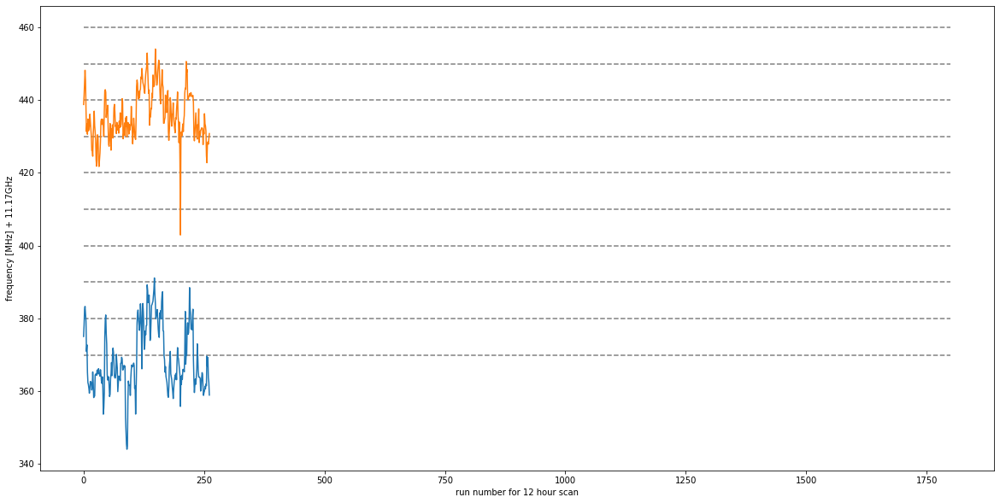

In [52]:
plt.figure(figsize=(20,10))

for ii in range(10):
    plt.plot(np.linspace(0,1800,100), np.zeros(100)+370+10*ii, '--', color='grey')
    
plt.plot(fitOutcomes[:,2])
plt.plot(fitOutcomes[:,3])

plt.ylabel("frequency [MHz] + 11.17GHz")
plt.xlabel("run number for 12 hour scan")
#plt.xlim([0,1800])


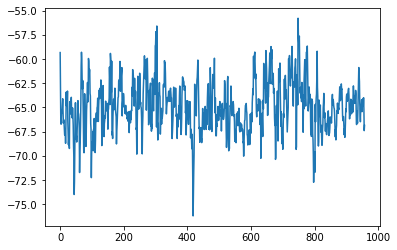

In [17]:
plt.plot(fitOutcomes[:,2]-fitOutcomes[:,3])

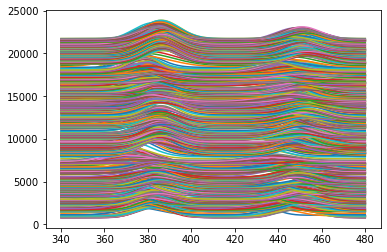

In [18]:


for l in range(len(runAvgY[:,0])):
        popt, pcov = curve_fit(doubleGaussian, xData, runAvgY[l,:], p0=poptAvg,bounds=giveLimits)
        fitOutcomes[l,:]=popt
        plt.plot(xData,max(yAvg)*l+100*doubleGaussian(xData,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3],fitOutcomes[l,4],fitOutcomes[l,5],fitOutcomes[l,6]))   

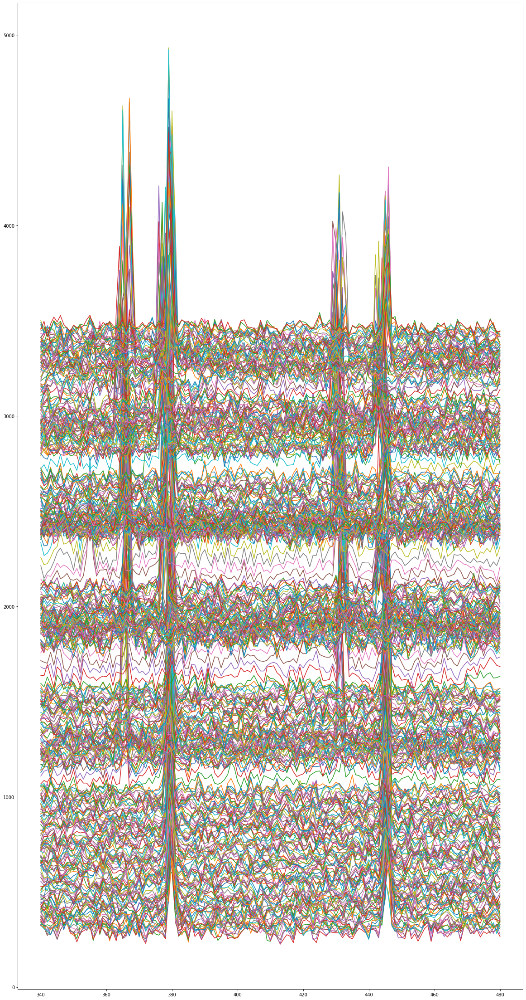

In [56]:
plt.figure(figsize=(20,40))

for l in range(len(runAvgY[:,0])):
        plt.plot(xData,max(yAvg)*l+100*runAvgY[l,:])   

sweeper_bwd_scans_09_29_19.txt
sweeper_fwd_scans_09_29_16.txt


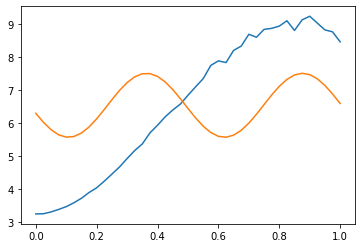

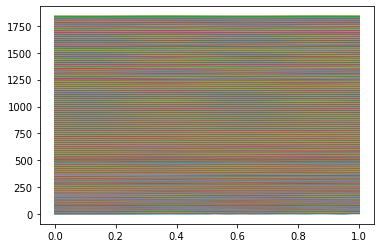

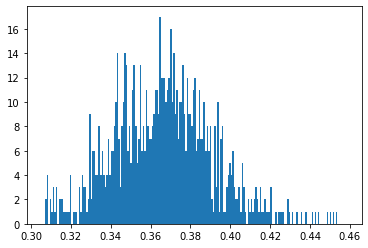

<Figure size 432x288 with 0 Axes>

In [92]:
#Fit Rabi
#Automatically finds newest file
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
from os import listdir
from os.path import isfile, join
%matplotlib inline

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

#Folder where data is stored
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\04\\01"
#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\04\\01"
def gaussian(x, a1,  c1,  w1, o):
    return a1*np.exp(-(x-c1)**2/(2*w1**2))+o
def Rabi(x, a1, p1, w1, o):
    return a1*np.sin(2*np.pi*(x/w1+p1))+o

def Rabialt(x, a1, w1, o):
    return a1*np.sin(2*np.pi*(x/w1))+o
    


#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]
               
                     
for l in indMax:
    if '_scans_' in textFiles[l]:
        print(textFiles[l])
        rawData = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_avg_' in textFiles[l]:
        avgData = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgData[0,:]

#Average Rabi Fit
yAvg=avgData[1,:]
plt.plot(xData,yAvg)
initGuess=[(max(yAvg)-min(yAvg)),-1/4,(max(xData)-min(xData))/1.2,np.mean(yAvg)]
giveLimits=([0,-1/2,(max(xData)-min(xData))/30,0],[max(yAvg)*2,1/2,(max(xData)-min(xData))*5,max(yAvg)*2])
poptAvg, pcov = curve_fit(Rabi, xData, yAvg, p0=initGuess,bounds=giveLimits)
plt.plot(xData,Rabi(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3]))
                     
if len(saveFolder) > 1:
    plt.savefig(join(saveFolder, 'AvgRabi_'+textFilesTimes[indMax[0]]))
    f = open(join(saveFolder, 'AvgRabi_'+textFilesTimes[indMax[0]])+'.txt', "a")
    f.write("amp1, phase1, width1, offset\n")
    f.write("a1*np.sin(2*np.pi*(x/w1+p1)+o\n")
    f.write(str(poptAvg))
    f.close()

#Running Average Rabi Fit
numAvg=4 #Number of scans being averaged into each fit
if numAvg < np.shape(rawData)[0]:
    runAvgY=np.zeros([np.shape(rawData)[0]-numAvg+1,np.shape(rawData)[1]])
    for l in range(len(xData)):
        runAvgY[:,l]=np.convolve(rawData[:,l], np.ones(numAvg)/numAvg, mode='valid')

    plt.figure()
    plt.plot(xData,runAvgY[int(len(runAvgY[:,0])/2),:])

    fitOutcomes=np.zeros([len(runAvgY[:,0]),len(initGuess)])

    for l in range(len(runAvgY[:,0])):
        popt, pcov = curve_fit(Rabi, xData, runAvgY[l,:], p0=poptAvg,bounds=giveLimits)
        fitOutcomes[l,:]=popt
        plt.plot(xData,max(yAvg)/5*l+Rabi(xData,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3]))               
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RunAvgRabi_'+textFilesTimes[indMax[0]]))

    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RAvgRabi_'+textFilesTimes[indMax[0]]))
        f = open(join(saveFolder, 'RAvgRabi_'+textFilesTimes[indMax[0]])+'.txt', "a")
        f.write(str(fitOutcomes))
        f.close()
    
    piTimes=np.zeros(len(fitOutcomes[:,2]))
    for l in range(len(fitOutcomes[:,2])):
        testSpace=np.linspace(0,fitOutcomes[l,2],600)
        piTimes[l]=testSpace[np.argmax(Rabi(testSpace,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3]))]


    plt.figure()
    plt.hist(piTimes,bins=200,range=(np.mean(piTimes)*.8,np.mean(piTimes)*1.2))
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'HistWidth1_'+textFilesTimes[indMax[0]]))
    plt.figure()
    cent1hist, cent1bins = np.histogram(piTimes, bins=200)
    #popt1, pcov = curve_fit(gaussian, cent1bins[:-1]+(cent1bins[1]-cent1bins[2])/2, cent1hist, p0=[0.7,cent1bins[np.argmax(cent1hist)],5,        0])
    #print("piTime 1 opt: " + str(popt1[1]))
 


sweeper_fwd_scans_18_58_37.txt


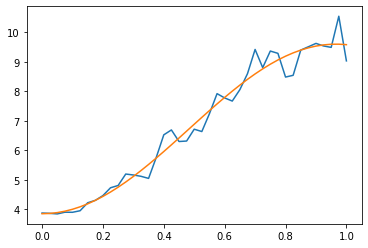

In [87]:


    


#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]
               
                     
for l in indMax:
    if '_scans_' in textFiles[l]:
        print(textFiles[l])
        rawData = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_avg_' in textFiles[l]:
        avgData = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgData[0,:]

def Rabialt(x, a1, w1, o):
    return a1*np.sin(2*np.pi*(x/w1) -np.pi/2)+o

#Average Rabi Fit
yAvg=avgData[1,:]
plt.plot(xData,yAvg)
initGuess=[(max(yAvg)-min(yAvg))/2,(max(xData)-min(xData))/0.5,3.5]
giveLimits=([0,(max(xData)-min(xData))/30,0],[max(yAvg)*2,(max(xData)-min(xData))*5,max(yAvg)*2])
poptAvg, pcov = curve_fit(Rabialt, xData, yAvg, p0=initGuess,bounds=giveLimits)
plt.plot(xData,Rabialt(xData,poptAvg[0],poptAvg[1],poptAvg[2]))
#plt.plot(xData,Rabialt(xData,3.5,2,7))

In [88]:
xData[np.argmax(Rabialt(xData,poptAvg[0],poptAvg[1],poptAvg[2]))]

0.9750000000000001

(0.6, 0.8)

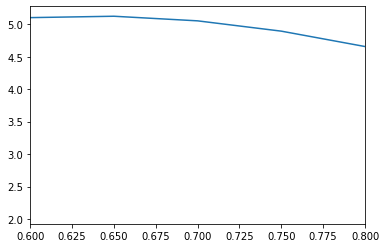

In [22]:
plt.plot(xData,Rabialt(xData,poptAvg[0],poptAvg[1],poptAvg[2]))
plt.xlim([0.6,0.8])

In [23]:
xData[np.argmax(Rabialt(xData,poptAvg[0],poptAvg[1],poptAvg[2]))]

0.65

In [89]:
a = [0,1,2]

In [91]:
a[1:2:2]

[1]

(0.6, 0.8)

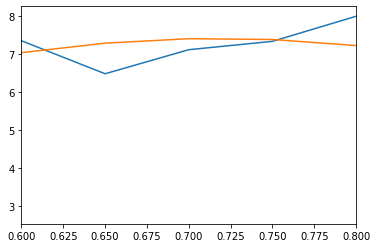

In [15]:

plt.plot(xData,yAvg)
plt.plot(xData,Rabi(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3]))
plt.xlim([0.6,0.8])

piTime 1 opt: 99.7922505927744


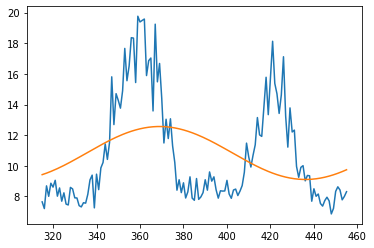

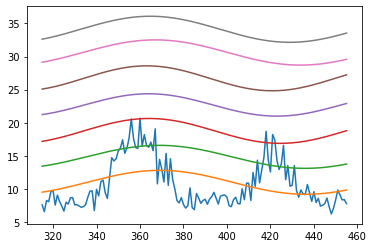

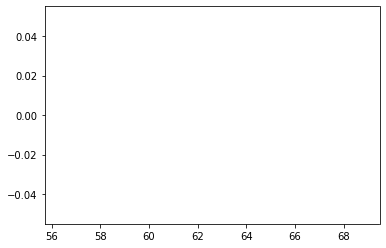

<Figure size 432x288 with 0 Axes>

In [99]:
#Fit Rabi
#Give it a target timestape
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
from os import listdir
from os.path import isfile, join
%matplotlib inline

#In Int Form
targetTimeStamp=112630

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

#Folder where data is stored
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\14"
#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\14"
def gaussian(x, a1,  c1,  w1, o):
    return a1*np.exp(-(x-c1)**2/(2*w1**2))+o
def Rabi(x, a1, p1, w1, o):
    return a1*np.sin(2*np.pi*(x/w1+p1))+o
    


#Find files matching the target timestamp
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=targetTimeStamp
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]
            
                   
for l in indMax:
    if '_scans_' in textFiles[l]:
        rawData = np.loadtxt(targetFolder + '/' +textFiles[l])
 
    if '_avg_' in textFiles[l]:
        avgData = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgData[0,:]

#Average Rabi Fit
yAvg=avgData[1,:]
plt.plot(xData,yAvg)
initGuess=[(max(yAvg)-min(yAvg)),-1/4,(max(xData)-min(xData))/1.2,np.mean(yAvg)]
giveLimits=([0,-1/2,(max(xData)-min(xData))/30,0],[max(yAvg)*2,1/2,(max(xData)-min(xData))*5,max(yAvg)*2])
poptAvg, pcov = curve_fit(Rabi, xData, yAvg, p0=initGuess,bounds=giveLimits)
plt.plot(xData,Rabi(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3]))
#plt.plot(xData,Rabi(xData,initGuess[0],initGuess[1],initGuess[2],initGuess[3]))
                     
if len(saveFolder) > 1:
    plt.savefig(join(saveFolder, 'AvgRabi_'+textFilesTimes[indMax[0]]))
    f = open(join(saveFolder, 'AvgRabi_'+textFilesTimes[indMax[0]])+'.txt', "a")
    f.write("amp1, phase1, width1, offset\n")
    f.write("a1*np.sin(2*np.pi*(x/w1+p1)+o\n")
    f.write(str(poptAvg))
    f.close()

#Running Average Rabi Fit
numAvg=5 #Number of scans being averaged into each fit
if numAvg < np.shape(rawData)[0]:
    runAvgY=np.zeros([np.shape(rawData)[0]-numAvg+1,np.shape(rawData)[1]])
    for l in range(len(xData)):
        runAvgY[:,l]=np.convolve(rawData[:,l], np.ones(numAvg)/numAvg, mode='valid')

    plt.figure()
    plt.plot(xData,runAvgY[int(len(runAvgY[:,0])/2),:])

    fitOutcomes=np.zeros([len(runAvgY[:,0]),len(initGuess)])

    for l in range(len(runAvgY[:,0])):
        popt, pcov = curve_fit(Rabi, xData, runAvgY[l,:], p0=poptAvg,bounds=giveLimits)
        fitOutcomes[l,:]=popt
        plt.plot(xData,max(yAvg)/5*l+Rabi(xData,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3]))               
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RunAvgRabi_'+textFilesTimes[indMax[0]]))

    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'RAvgRabi_'+textFilesTimes[indMax[0]]))
        f = open(join(saveFolder, 'RAvgRabi_'+textFilesTimes[indMax[0]])+'.txt', "a")
        f.write(str(fitOutcomes))
        f.close()
    
    piTimes=np.zeros(len(fitOutcomes[:,2]))
    for l in range(len(fitOutcomes[:,2])):
        testSpace=np.linspace(0,fitOutcomes[l,2],300)
        piTimes[l]=testSpace[np.argmax(Rabi(testSpace,fitOutcomes[l,0],fitOutcomes[l,1],fitOutcomes[l,2],fitOutcomes[l,3]))]


    plt.figure()
    plt.hist(piTimes,bins=200,range=(np.mean(piTimes)*.9,np.mean(piTimes)*1.1))
    if len(saveFolder) > 1:
        plt.savefig(join(saveFolder, 'HistWidth1_'+textFilesTimes[indMax[0]]))
    plt.figure()
    cent1hist, cent1bins = np.histogram(piTimes, bins=200)
    popt1, pcov = curve_fit(gaussian, cent1bins[:-1]+(cent1bins[1]-cent1bins[2])/2, cent1hist, p0=[40,cent1bins[np.argmax(cent1hist)],5,        0])
    print("piTime 1 opt: " + str(popt1[1]))
 


In [10]:
#Fit Rabi
#Take Data From Input Vectors

#Requirements
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
from os import listdir
from os.path import isfile, join
from datetime import datetime
%matplotlib inline



def Rabi(x, a1, p1, w1, o):
    return a1*np.sin(2*np.pi*(x/w1+p1))+o

#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\28"

def vecRabiFit(xData,yData):
    plt.figure()
    plt.plot(xData,yData)
    initGuess=[(max(yData)-min(yData)),-1/4,(max(xData)-min(xData))/1.2,np.mean(yData)]
    giveLimits=([0,-1/2,(max(xData)-min(xData))/30,0],[max(yData)*2,1/2,(max(xData)-min(xData))*5,max(yData)*2])
    poptAvg, pcov = curve_fit(Rabi, xData, yData, p0=initGuess,bounds=giveLimits)
    plt.plot(xData,Rabi(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3])) 
    testSpace=np.linspace(0,poptAvg[2],300)
    piTime=testSpace[np.argmax(Rabi(testSpace,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3]))]
    now = datetime.now()
    current_time = now.strftime("%H_%M_%S")
    plt.savefig(join(saveFolder, 'VecRabi_'+current_time))
    return piTime


0.3861140257362102

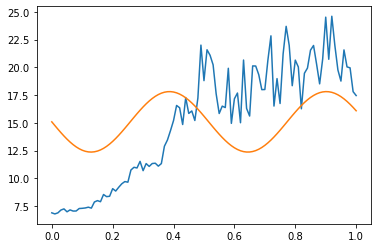

In [11]:
vecRabiFit(xData,yAvg)

In [101]:
#Fit Double ODMR
#Take Data From Input Vectors

#Requirements
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
from os import listdir
from os.path import isfile, join
from datetime import datetime
%matplotlib inline

def doubleGaussian(x, a1, a2, c1, c2, w1, w2,o):
    return a1*np.exp(-(x-c1)**2/(2*w1**2))+a2*np.exp(-(x-c2)**2/(2*w2**2))+o

#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\14"

def vecODMRFit(xData,yData):
    plt.figure()
    plt.plot(xData,yData)
    cent=max(yData)-min(yData)
    xMax=max(xData)
    xMin=min(xData)
    initGuess=[cent,cent, xData[int(len(xData)/3)], xData[int(2*len(xData)/3)],xMax/40,xMax/40,min(yData)]
    giveLimits=([3,3,xMin,xMin,xMax/200,xMax/200,min(yAvg)/1.5],[max(yAvg),max(yAvg),xMax,xMax,xMax/15,xMax/15,max(yAvg)*1.5])
    poptAvg, pcov = curve_fit(doubleGaussian, xData, yData, p0=initGuess,bounds=giveLimits)
    plt.plot(xData,doubleGaussian(xData,poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3],poptAvg[4],poptAvg[5],poptAvg[6]))
    now = datetime.now()
    current_time = now.strftime("%H_%M_%S")
    plt.savefig(join(saveFolder, 'VecODMR_'+current_time))
    cents=[poptAvg[2],poptAvg[3]]
    return cents

[359.7557215560117, 421.8185985763432]

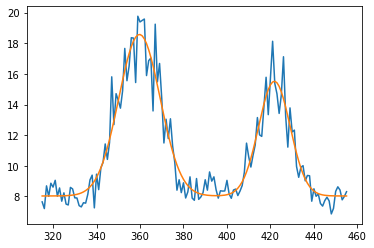

In [102]:
vecODMRFit(xData,yAvg)

sweeper_fwd_scans_14_24_00.txt
45
Lamba1: 4.9706853347319875
Lamba2: 22.30810518561905
Fidelity Estimate: 0.9883197700006565


<Figure size 432x288 with 0 Axes>

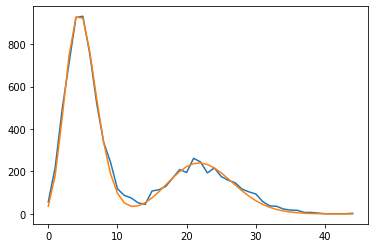

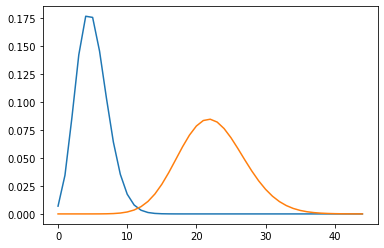

In [228]:
#Histogram Quantum Jumps
#Automatically finds newest file
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from os import listdir
from os.path import isfile, join
from scipy.special import factorial
from scipy.stats import poisson
%matplotlib inline

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

def doublePois(k, lamb1, lamb2,a1,a2):
    return a1*poisson.pmf(k, lamb1)+a2*poisson.pmf(k, lamb2)

cutoff=1

#Folder where data is stored
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\16"
#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\16"

#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]
               
                     
for l in indMax:
    if '_scans_' in textFiles[l]:
        print(textFiles[l])
        rawData = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_avg_' in textFiles[l]:
        avgData = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgData[0,:]


#meanData=np.mean(rawData,axis=1)
#removeLines= np.where(meanData==0,1,0)
#for i in range(len(removeLines)):
#    j=len(removeLines)-i-1
#    if removeLines[j] ==1:
#        rawData=np.delete(rawData, j, axis=0)

plt.figure()
flatData=rawData.flatten()
n_bins=int(max(flatData))

dataSize=np.size(flatData)

print(n_bins)

#Plot and Fit Hist
cHist, cBins = np.histogram(flatData, bins=n_bins, range=(0,n_bins))
initGuess=[6,45,dataSize/2,dataSize/4]
poptAvg, pcov = curve_fit(doublePois, cBins[:-1], cHist, p0=initGuess)
plt.figure()
plt.plot(cBins[:-1],cHist)
plt.plot(cBins[:-1],doublePois(cBins[:-1],poptAvg[0],poptAvg[1],poptAvg[2],poptAvg[3]))
#plt.plot(cBins[:-1],doublePois(cBins[:-1],5,25,dataSize/2,dataSize/4))
if len(saveFolder) > 1:
    plt.savefig(join(saveFolder, 'QJumpHist_'+textFilesTimes[indMax[0]]))
print("Lamba1: " + str(poptAvg[0]))
print("Lamba2: " + str(poptAvg[1]))

#Fidelity Estimate
lowFit=1*poisson.pmf(cBins[:-1], poptAvg[0])
highFit=1*poisson.pmf(cBins[:-1], poptAvg[1])
FidEst=(np.sum(np.where(lowFit <= highFit,lowFit,0))+np.sum(np.where(highFit <= lowFit,highFit,0)))/sum(lowFit)/sum(highFit)
plt.figure()
plt.plot(cBins[:-1],lowFit)
plt.plot(cBins[:-1],highFit)
if len(saveFolder) > 1:
    plt.savefig(join(saveFolder, 'QJumpHistIndFits_'+textFilesTimes[indMax[0]]))
print("Fidelity Estimate: " + str(1-FidEst))
 

Init Fidelity: 0.9861818181818182
Pi Fidelity: 0.9618181818181818


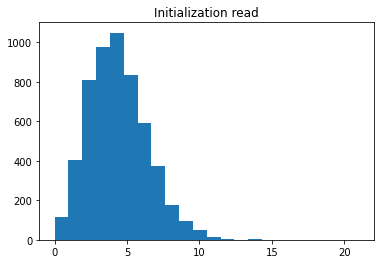

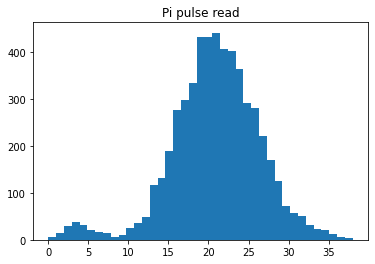

In [174]:
#Histogram Init Low Init High
#Automatically finds newest file
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from os import listdir
from os.path import isfile, join
from scipy.special import factorial
from scipy.stats import poisson
%matplotlib inline

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

def doublePois(k, lamb1, lamb2,a1,a2):
    return a1*poisson.pmf(k, lamb1)+a2*poisson.pmf(k, lamb2)
#cutoff for low vs high readout
cutoff=10

#Folder where data is stored
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\04\\01"
#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\04\\01"

#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]

                     
for l in indMax:
    if '_fwd_scans_' in textFiles[l]:
        rawDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_scans_' in textFiles[l]:
        rawDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_fwd_avg_' in textFiles[l]:
        avgDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_avg_' in textFiles[l]:
        avgDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgDataFwd[0,:]
fwdFlat=rawDataFwd[1:-2,:].flatten()
bwdFlat=rawDataBwd[1:-2,:].flatten()
fwdMax=int(max(fwdFlat))
bwdMax=int(max(bwdFlat))
plt.figure()
plt.hist(fwdFlat, bins=fwdMax,range=(0,fwdMax-1))
plt.title('Initialization read')
plt.figure()
plt.hist(bwdFlat, bins=bwdMax,range=(0,bwdMax-1))
plt.title('Pi pulse read')
initFidelity= np.sum(np.where(fwdFlat<cutoff,1,0))/np.size(fwdFlat)
print("Init Fidelity: " + str(initFidelity))
piFidelity= np.sum(np.where(bwdFlat>cutoff,1,0))/np.size(fwdFlat)
print("Pi Fidelity: " + str(piFidelity))




ipykernel_launcher:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


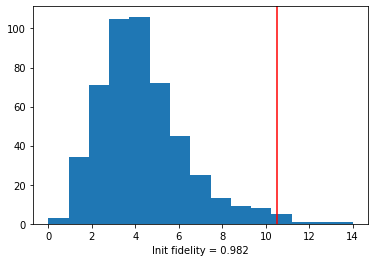

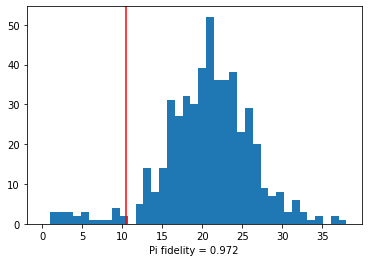

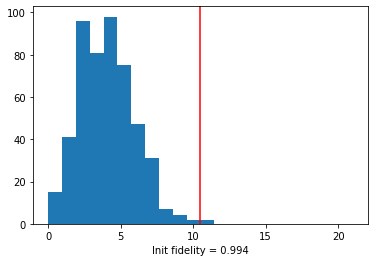

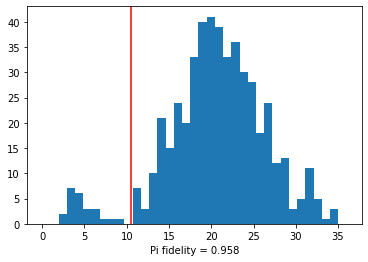

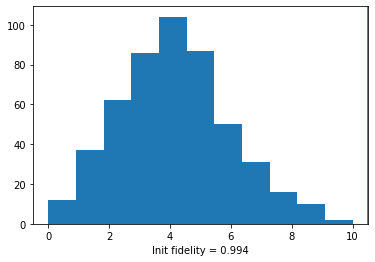

...

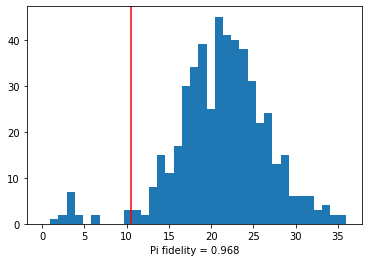

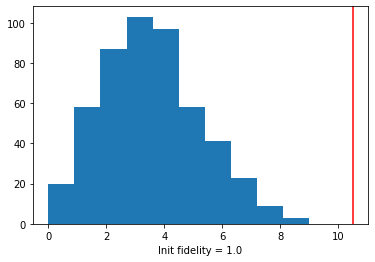

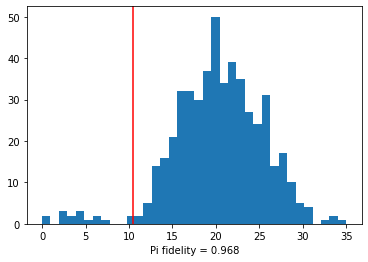

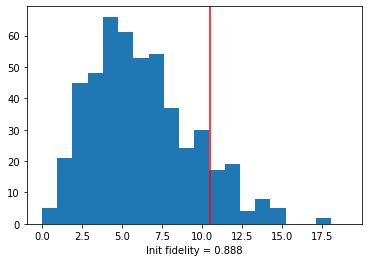

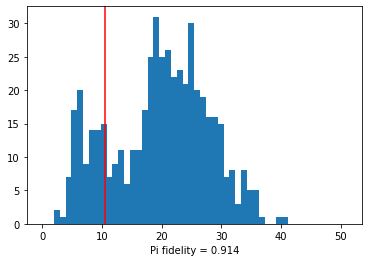

In [166]:
xData=avgDataFwd[0,:]
pi_fidelity_per_run = np.zeros(23)
for ii in range(12):
    fwdFlat=rawDataFwd[ii+1,:]
    bwdFlat=rawDataBwd[ii+1,:]
    fwdMax=int(max(fwdFlat))
    bwdMax=int(max(bwdFlat))
    cutoff = 10.5 #np.mean(fwdFlat+bwdFlat)/2
    initFidelity= np.sum(np.where(fwdFlat<cutoff,1,0))/np.size(fwdFlat)
    piFidelity= np.sum(np.where(bwdFlat>cutoff,1,0))/np.size(fwdFlat) + 1-initFidelity
    plt.figure()
    plt.hist(fwdFlat, bins=fwdMax,range=(0,fwdMax-1))
    plt.axvline(x=cutoff, color='red')
    plt.xlabel(f'Init fidelity = {initFidelity}')
    plt.figure()
    plt.hist(bwdFlat, bins=bwdMax,range=(0,bwdMax-1))
    plt.axvline(x=cutoff, color='red')
    plt.xlabel(f'Pi fidelity = {piFidelity}')
    pi_fidelity_per_run[ii] = piFidelity

(0.9, 1.0)

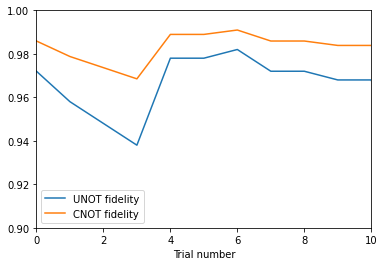

In [172]:
plt.plot(pi_fidelity_per_run, label='UNOT fidelity')
plt.plot(np.sqrt(pi_fidelity_per_run), label='CNOT fidelity')
plt.xlabel('Trial number')

plt.legend()
plt.xlim([0,10])
plt.ylim([0.9,1.0])

In [164]:
xData=avgDataFwd[0,:]
pi_fidelity_per_run = np.zeros(23)
for ii in range(23):
    fwdFlat=rawDataFwd[ii,:]
    bwdFlat=rawDataBwd[ii,:]
    fwdMax=int(max(fwdFlat))
    bwdMax=int(max(bwdFlat))
    cutoff = np.mean(fwdFlat+bwdFlat)/2
    initFidelity= np.sum(np.where(fwdFlat<cutoff,1,0))/np.size(fwdFlat)
    piFidelity= np.sum(np.where(bwdFlat>cutoff,1,0))/np.size(fwdFlat) + 1-initFidelity
    plt.figure()
    plt.hist(fwdFlat, bins=fwdMax,range=(0,fwdMax-1))
    plt.axvline(x=cutoff, color='red')
    plt.xlabel(f'Init fidelity = {initFidelity}')
    plt.figure()
    plt.hist(bwdFlat, bins=bwdMax,range=(0,bwdMax-1))
    plt.axvline(x=cutoff, color='red')
    plt.xlabel(f'Pi fidelity = {piFidelity}')
    pi_fidelity_per_run[ii] = piFidelity
    

ValueError: `bins` must be positive, when an integer

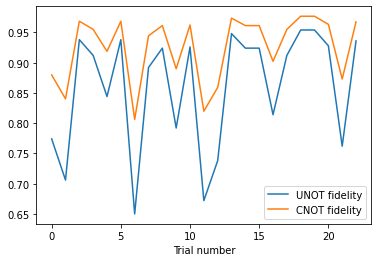

In [161]:
plt.plot(pi_fidelity_per_run, label='UNOT fidelity')
plt.plot(np.sqrt(pi_fidelity_per_run), label='CNOT fidelity')
plt.xlabel('Trial number')
plt.legend()

In [37]:
rawDataFwd[:-1,:]

array([[ 0.,  3.,  4.,  1.,  2.,  1.,  3.,  2.,  1.,  6.,  2.,  4.,  4.,
         2.,  3.,  5.,  4.,  3.,  2.,  3.,  6.,  2.,  2.,  4.,  3.,  3.,
         3.,  2.,  4.,  2.,  6.,  5.,  2.,  2.,  3.,  3.,  2.,  3.,  4.,
         2.,  2.,  2.,  2.,  4.,  4.,  0.,  1.,  0.,  2.,  3.,  2.,  3.,
         2.,  2.,  2.,  2.,  1.,  3.,  2.,  3.,  3.,  4.,  2.,  5.,  6.,
         1.,  7.,  2.,  2.,  1.,  1.,  3.,  1.,  1.,  8.,  5.,  2.,  1.,
         6.,  1.,  4.,  0.,  0.,  3.,  1.,  3.,  6.,  4.,  1.,  5.,  3.,
         7.,  4.,  2.,  1.,  1., 21.,  2.,  1.,  0.],
       [ 2.,  3.,  6.,  3.,  7.,  4.,  3.,  5.,  1.,  1.,  2.,  3.,  1.,
         2.,  2.,  1.,  2.,  1.,  2.,  2.,  3.,  2.,  2.,  4.,  1.,  3.,
         3.,  3.,  1.,  3.,  4.,  0.,  5.,  5.,  2.,  4.,  4.,  1.,  6.,
         9.,  2.,  5.,  2.,  2.,  5.,  3.,  5.,  5.,  4.,  4.,  3.,  4.,
         5.,  0.,  2.,  5.,  1.,  2.,  3.,  1.,  3.,  7.,  5.,  4.,  0.,
         1.,  3.,  5.,  2.,  2.,  1.,  3.,  1.,  5.,  7.,  2.,  1.,  2

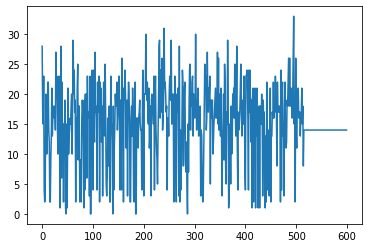

In [35]:
plt.plot(bwdFlat)

In [44]:
piFidelity = np.zeros(27)
for ii in range(27):
    piFidelity[ii]= np.sum(np.where(rawDataBwd[ii]>cutoff,1,0))/1.01

Text(0.5, 0, 'Run number (over period of 15mn)')

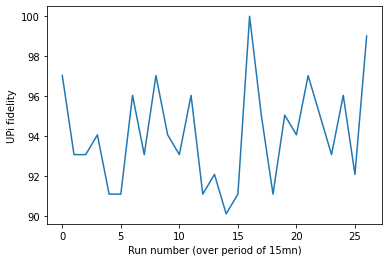

In [47]:
plt.plot(piFidelity)
plt.ylabel('UPi fidelity')
plt.xlabel('Run number (over period of 15mn)')

In [43]:
rawDataBwd[15]

array([27., 26., 37., 35., 40., 17., 25., 26., 31., 21., 33., 28., 35.,
       32., 18., 32., 34., 30., 25., 24., 39., 27., 31., 22., 20., 32.,
       25., 20., 33., 25., 28., 18., 24., 36., 25., 30., 25., 24., 30.,
        6., 30., 34., 29., 22., 22., 23.,  6., 27., 35., 27., 31., 25.,
       36., 36., 32., 31., 21., 25., 37., 24., 38., 37., 34., 21., 32.,
       30., 34., 32., 30., 29., 35., 10., 34., 25., 27., 34., 20., 28.,
       29., 35., 16., 41., 27., 29., 20., 31., 27., 27., 29., 30., 27.,
       26., 25., 30., 31., 24., 31., 23., 24., 28., 32.])

Cpi Fidelity: 0.8702691658634307


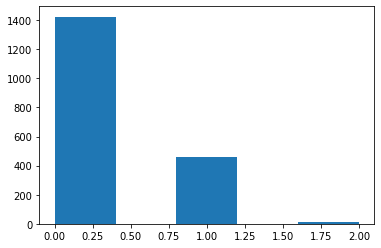

In [81]:
#Histogram Double CPi Fidelity
#Automatically finds newest file
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit
from os import listdir
from os.path import isfile, join
from scipy.special import factorial
from scipy.stats import poisson
%matplotlib inline

def only_numerics(seq):
    seq_type= type(seq)
    return seq_type().join(filter(seq_type.isdigit, seq))

def doublePois(k, lamb1, lamb2,a1,a2):
    return a1*poisson.pmf(k, lamb1)+a2*poisson.pmf(k, lamb2)
#cutoff for low vs high readout
cutoff=11.5

#Folder where data is stored
targetFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\31"
#Folder where you want to save output graphs
saveFolder="D:\\Dropbox\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\scan_1d\\data\\2021\\03\\31"

#Find latest timestamp in target folder and extract data from avg and scans files in with that timestamp.
#Maybe todo, allow timestamp to be moved to anywhere in the filename

files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]

                     
for l in indMax:
    if '_fwd_scans_' in textFiles[l]:
        rawDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_scans_' in textFiles[l]:
        rawDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_fwd_avg_' in textFiles[l]:
        avgDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_avg_' in textFiles[l]:
        avgDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgDataFwd[0,:]
fwdFlat=rawDataFwd[:-1,:].flatten()
bwdFlat=rawDataBwd[:-1,:].flatten()
fwdMax=int(max(fwdFlat))
bwdMax=int(max(bwdFlat))

#If combined readout is 2 both readout up. If 0, both down. If 1, one up one down. 0 and 2 are good results, 1 is bad.
combinedReadout=np.where(fwdFlat>cutoff,1,0)+np.where(bwdFlat>cutoff,1,0)
cpiFidelity=np.sum(np.where(combinedReadout==2,1,0)+np.where(combinedReadout==0,1,0))/np.size(combinedReadout)
plt.figure()
plt.hist(combinedReadout,bins=5)
print("Cpi Fidelity: " + str(np.sqrt(cpiFidelity)))



In [63]:
np.shape(rawDataFwd)[0]

24

In [64]:
cpiFidelity = np.zeros(np.shape(rawDataFwd)[0])
for ii in range(np.shape(rawDataFwd)[0]):
    combinedReadout=np.where(rawDataFwd[ii]>cutoff,1,0)+np.where(rawDataBwd[ii]>cutoff,1,0)
    cpiFidelity[ii]=np.sqrt(np.sum(np.where(combinedReadout==2,1,0)+np.where(combinedReadout==0,1,0))/101)*100

Text(0.5, 0, 'Run number (over period of 10mn)')

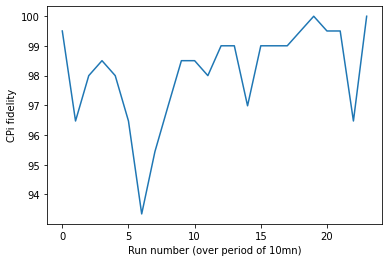

In [65]:
plt.plot(cpiFidelity)
plt.ylabel('CPi fidelity')
plt.xlabel('Run number (over period of 10mn)')

In [201]:
if [3,2,4]:
    print("hello")

hello


In [239]:
1/(500*10**-9)

1999999.9999999998

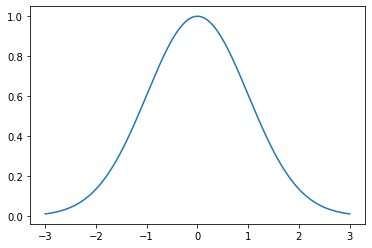

In [242]:
w = 1
x = np.linspace(-3*w, 3*w, 1000)


plt.plot(x, np.exp(-x**2/2/w**2))

In [132]:
files = [f for f in listdir(targetFolder) if isfile(join(targetFolder, f))]
textFiles=[f for f in files if f[-4:]=='.txt']
textFilesTimes=[only_numerics(f[-12:-4]) for f in textFiles]
textFilesTimesInt=[int(f) for f in textFilesTimes]
intMax=max(textFilesTimesInt)
indMax=[f for f in range(len(textFilesTimesInt)) if (textFilesTimesInt[f]>=intMax-3 and textFilesTimesInt[f]<=intMax+3)]

                     
for l in indMax:
    if '_fwd_scans_' in textFiles[l]:
        rawDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_scans_' in textFiles[l]:
        rawDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_fwd_avg_' in textFiles[l]:
        avgDataFwd = np.loadtxt(targetFolder + '/' +textFiles[l])
    if '_bwd_avg_' in textFiles[l]:
        avgDataBwd = np.loadtxt(targetFolder + '/' +textFiles[l])
xData=avgDataFwd[0,:]

In [183]:
rawData1 = np.loadtxt(filename)

In [267]:
filename = "C:\\Users\\b16lu\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\datataker\\data\\2021\\04\\07\\nrabi-5v_low-readingtraceavg_10_25_27.txt"
filename2 = "C:\\Users\\b16lu\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\datataker\\data\\2021\\04\\07\\nrabi-5v_high-readingtraceavg_10_25_27.txt"
x = "C:\\Users\\b16lu\\Dropbox (Lukin SiV)\\SiV Quick Sharing\\B16 python experiments\\datataker\\data\\2021\\04\\07\\nrabi-5v_low-readingtraceavg_x_10_25_27.txt"

In [268]:
rawData1 = np.loadtxt(filename)
rawData2 = np.loadtxt(filename2)
x = np.loadtxt(x)

In [226]:
len(rawData1)

1774

In [238]:
from scipy import signal

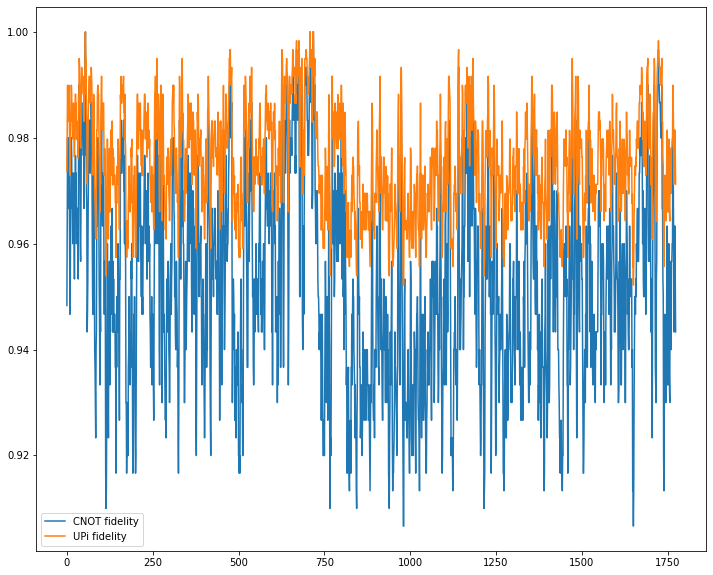

In [245]:
plt.figure(figsize=(12,10))
plt.plot(signal.savgol_filter(np.min((rawData1,np.ones(len(rawData1))),axis=0),3,1), label='CNOT fidelity')
plt.plot(signal.savgol_filter(np.sqrt(np.min((rawData1,np.ones(len(rawData1))),axis=0)),3,1), label='UPi fidelity')
#plt.plot(rawData2, label='lower Rabi Pi amplitude')
plt.legend()


Text(0.5, 0, 'RF pulse time (us)')

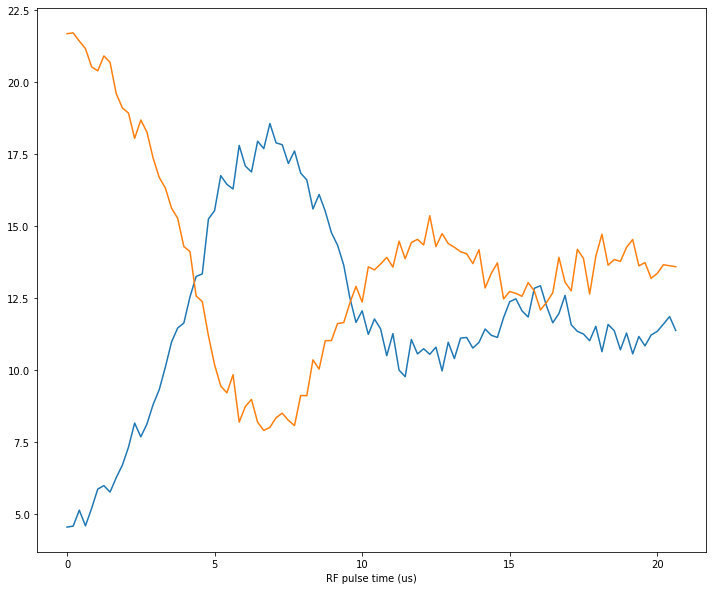

In [269]:
plt.figure(figsize=(12,10))
plt.plot(x/2400, rawData1)
plt.plot(x/2400, rawData2)
plt.xlabel('RF pulse time (us)')
#plt.xlim([29.6, 30])

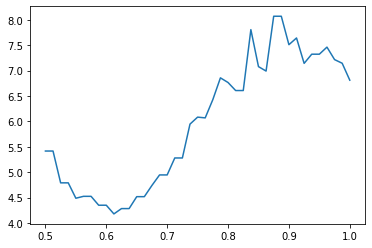

In [137]:
plt.plot(np.linspace(0.5,1.0,41), avgDataFwd[1])

In [141]:
n_avg = 5

xData = np.linspace(0.5,1.0,41)

pi_amp = np.zeros(np.shape(rawDataFwd)[0])
for ii in range(np.shape(rawDataFwd)[0]):
    yAvg = 0
    if ii <= n_avg:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[j,:]/n_avg
    elif (np.shape(rawDataFwd)[0] - ii) <= n_avg:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[np.shape(rawDataFwd)[0]-n_avg+j,:]/n_avg
    else:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[int(ii-(n_avg-1)/2+j),:]/n_avg
    pi_amp[ii] = xData[np.argmin(yAvg)]

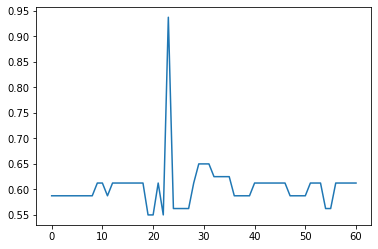

In [142]:
plt.plot(pi_amp)

In [121]:
def fit_rabi(x, f, a, o):
    return a*np.sin(np.pi*f*x - np.pi/2) + o

n_avg = 11

xData = np.linspace(0,1.0,41)

pi_amp = np.zeros(np.shape(rawDataFwd)[0])
error = np.zeros(np.shape(rawDataFwd)[0])
for ii in range(np.shape(rawDataFwd)[0]):
    yAvg = 0
    if ii <= n_avg:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[j,:]/n_avg
    elif (np.shape(rawDataFwd)[0] - ii) <= n_avg:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[np.shape(rawDataFwd)[0]-n_avg+j,:]/n_avg
    else:
        for j in range(n_avg):
            yAvg = yAvg + rawDataFwd[int(ii-(n_avg-1)/2+j),:]/n_avg
    fit = curve_fit(fit_rabi, xData, yAvg, p0=[1.0, 10.0, 9.0],bounds=([0.5, 1.0, 2.0], [10, 30.0, 20.0]))
    pi_amp[ii] = 1/fit[0][0]
    error[ii] = 1/fit[1][0,0]
    

Text(0.5, 0, 'run number for 12 hour scan')

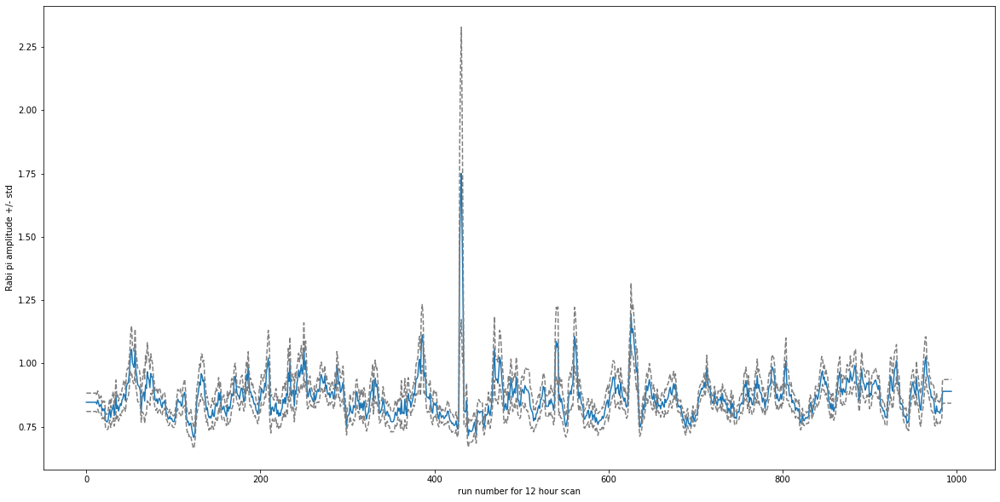

In [128]:
plt.figure(figsize=(20,10))

plt.plot(pi_amp)
plt.plot(pi_amp + pi_amp/np.sqrt(error), '--', color='grey')
plt.plot(pi_amp - pi_amp/np.sqrt(error), '--', color='grey')

plt.ylabel("Rabi pi amplitude +/- std")
plt.xlabel("run number for 12 hour scan")

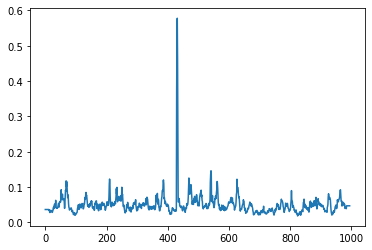

In [126]:

plt.plot(pi_amp/np.sqrt(error))

In [179]:
min((10,3))

3

In [ ]:
plt.plot(pi_amp)

In [ ]:
plt.plot(rawDataFwd[0,:]+rawDataFwd[1,:]+rawDataFwd[2,:])

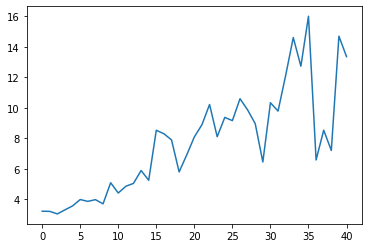

In [105]:
plt.plot((rawDataFwd[0,:]+rawDataFwd[1,:]+rawDataFwd[2,:])/3)

Text(0.5, 0, 'run number for 12 hour scan')

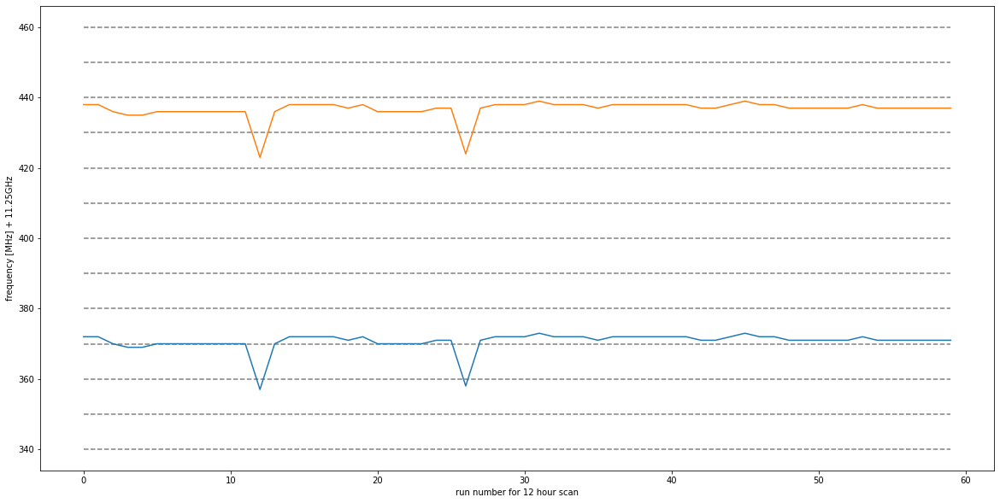

In [135]:
plt.figure(figsize=(20,10))

for ii in range(13):
    plt.plot(np.linspace(0,59,100), np.zeros(100)+340+10*ii, '--', color='grey')
    


plt.plot(rawDataBwd[:-1,0])
plt.plot(rawDataBwd[:-1,-1])


plt.ylabel("frequency [MHz] + 11.25GHz")
plt.xlabel("run number for 12 hour scan")
#plt.xlim([0,1800])

372.0
376.0
438.0
442.0


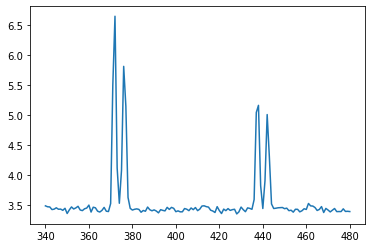

In [84]:
plt.plot(avgDataFwd[0,:],avgDataFwd[1,:])

for ii in range(len(avgDataFwd[1,:])-2):
    if avgDataFwd[1,ii] < avgDataFwd[1,ii+1] and avgDataFwd[1,ii+1] > avgDataFwd[1,ii+2] and avgDataFwd[1,ii+1] > 4:
        print(avgDataFwd[0,ii+1])

In [20]:
rawDataFwd = np.loadtxt(targetFolder + '\\' +'sweeper_fwd_avg_15_27_26.txt')

rawDataBwd = np.loadtxt(targetFolder + '\\' +'sweeper_bwd_avg_15_27_26.txt')

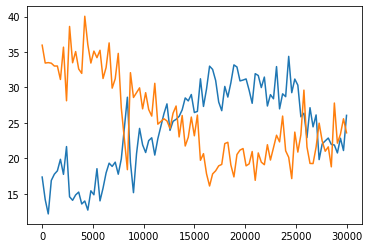

In [127]:
for i in range(np.shape(rawDataFwd)[1]):
    if rawDataFwd[0,i]<5:
        rawDataFwd[0,i] = (rawDataFwd[0,i-1]+rawDataFwd[0,i+1])/2
    
    if rawDataBwd[0,i]<5:
        rawDataBwd[0,i] = (rawDataBwd[0,i-1]+rawDataBwd[0,i+1])/2
    
    if rawDataFwd[1,i]<5:
        rawDataFwd[1,i] = (rawDataFwd[1,i-1]+rawDataFwd[1,i+1])/2
    
    if rawDataBwd[1,i]<5:
        rawDataBwd[1,i] = (rawDataBwd[1,i-1]+rawDataBwd[1,i+1])/2
    
plt.plot(xData, rawDataFwd[1])
plt.plot(xData, rawDataBwd[1])
#plt.xlim([29.6,29.9])#


Text(0, 0.5, 'Counts')

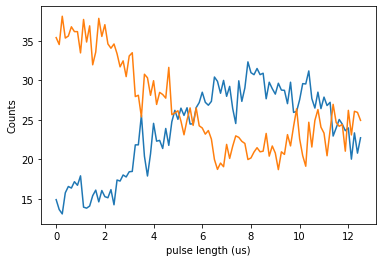

In [133]:
plt.plot(xData/2400, (rawDataFwd[0]+rawDataFwd[1])/2)
plt.plot(xData/2400, (rawDataBwd[0]+rawDataBwd[1])/2)
plt.xlabel("pulse length (us)")
plt.ylabel("Counts")

In [126]:
np.shape(rawDataFwd)[1]

101

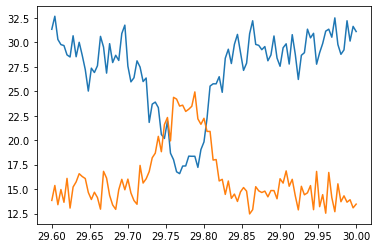

In [22]:
plt.plot(rawDataBwd[0], rawDataBwd[1])
plt.plot(rawDataBwd[0], rawDataFwd[1])


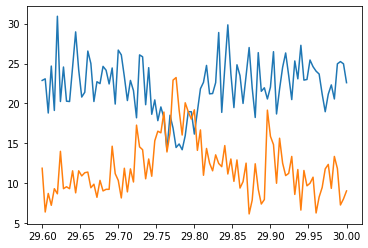

In [109]:
plt.plot(xData, rawDataBwd[2])
plt.plot(xData, rawDataFwd[2])
#plt.xlim([29.5,30])

(29.5, 30.0)

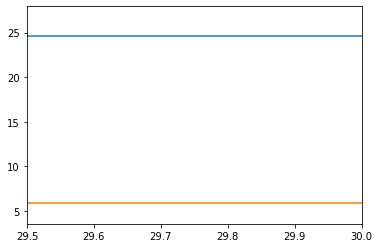

In [102]:
plt.plot(xData, rawDataBwd[3])
plt.plot(xData, rawDataFwd[3])
#plt.xlim([29.5,30])